### 1. Lets get Blurry
- The plots show that for both mean and median filters, the time taken increases significantly with larger image dimensions (256x256, 512x512, 1024x1024). The mean filter is consistently faster, with minimal variation across different kernel sizes. However, for larger images, the mean filter time increases noticeably as the kernel size increases. 
- In contrast, the median filter is much slower, especially for the largest image size, and exhibits a slight decrease in time as the kernel size grows. 
- In the plot for the Mean Filter, we observe that the time increases significantly for larger images (1024x1024), showing that the standard method scales poorly as image size and kernel size increase. The time remains almost constant for smaller images (256x256 and 512x512), indicating that for these smaller sizes, kernel size has minimal impact.
- In contrast, thet plot for the Fast Mean Filter shows a much more efficient algorithm. Across all image sizes, the time remains almost constant, with a much smaller time increase even for larger images and kernel sizes. This reflects the efficiency of the fast mean filter, which leverages shared pixel information between adjacent filter window positions to reduce computational complexity, especially for larger images.


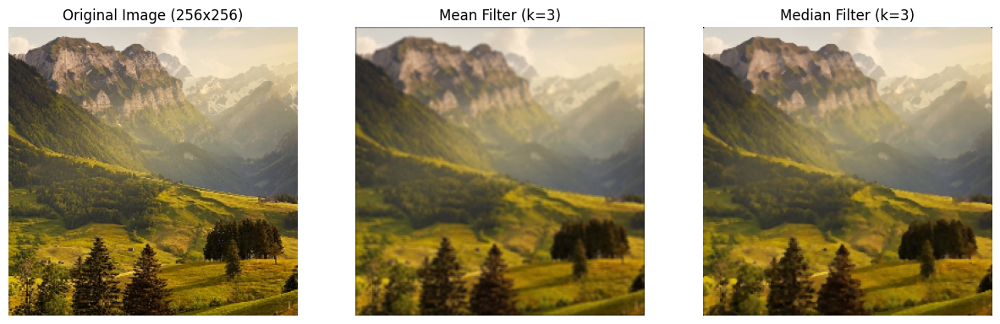

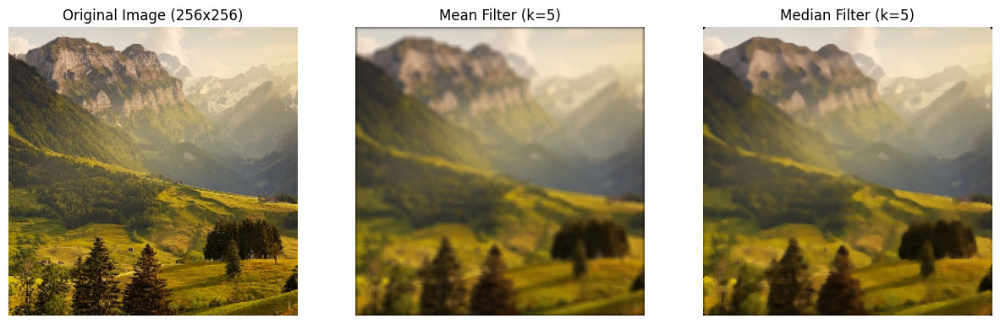

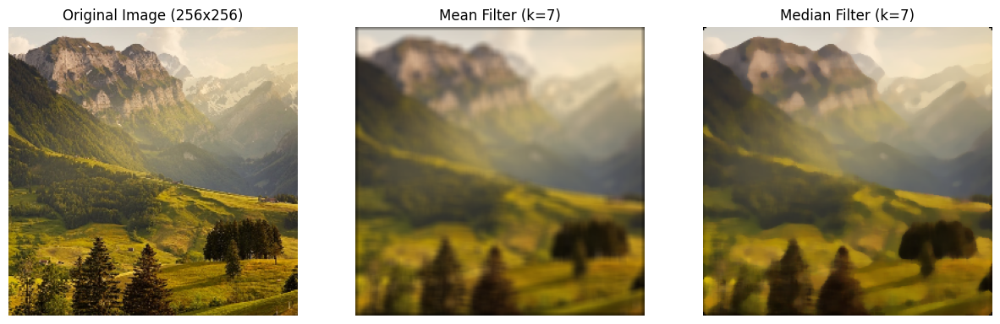

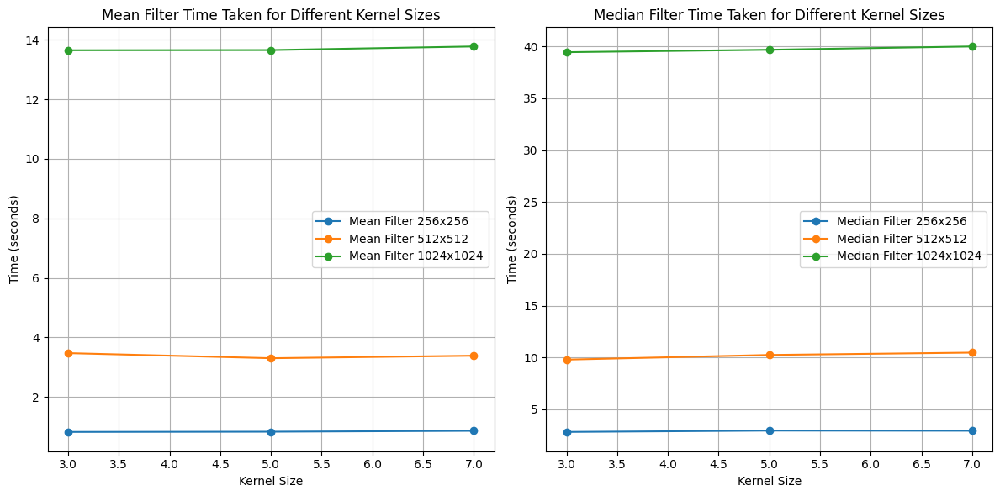

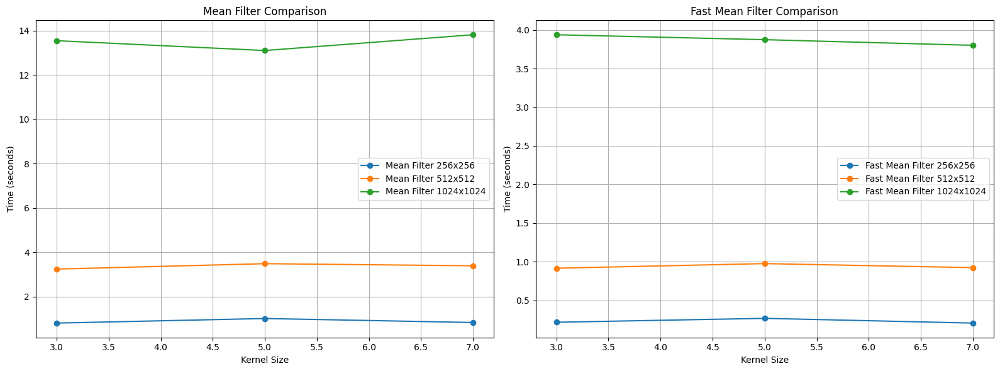

In [49]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

# --- 1. Load Image (as colored) ---
IMG1 = cv2.imread('../images/IMG1.jpg')
IMG1 = cv2.cvtColor(IMG1, cv2.COLOR_BGR2RGB)

def conv2D(img, kernel):
    # Get dimensions of the image and kernel
    img_height, img_width = img.shape
    kernel_height, kernel_width = kernel.shape

    # Calculate the padding size
    pad_height = kernel_height // 2
    pad_width = kernel_width // 2

    # Pad the image with zeros on the border
    padded_img = np.pad(img, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    # Create an output array to store the convolution result
    output = np.zeros_like(img, dtype=np.float64)

    # Perform convolution
    for i in range(img_height):
        for j in range(img_width):
            region = padded_img[i:i + kernel_height, j:j + kernel_width]
            output[i, j] = np.sum(region * kernel)

    return output

# --- 3. Define Mean Filter function ---
def meanFilter(img, k=5):
    # Generate mean filter kernel
    kernel = np.ones((k, k)) / (k * k)
    img1 = np.zeros_like(img)
    img1[:, :, 0] = conv2D(img[:, :, 0], kernel)
    img1[:, :, 1] = conv2D(img[:, :, 1], kernel)
    img1[:, :, 2] = conv2D(img[:, :, 2], kernel)
    # Apply the conv2D function
    return img1

# --- 4. Define Median Filter function ---
def medianFilter(img, k=5):
    h, w, c = img.shape
    pad_h, pad_w = k // 2, k // 2
    
    # Padding the image to handle borders
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='constant', constant_values=0)
    
    # Initializing the result image
    result = np.zeros_like(img)
    
    # Perform median filtering channel-wise
    for ch in range(c):
        for i in range(h):
            for j in range(w):
                result[i, j, ch] = np.median(padded_img[i:i+k, j:j+k, ch], axis=(0, 1))
    
    return result

# --- 5. Define Fast Mean Filter Function (Fixed Overflow Issue) ---
def fastMeanFilter(img, k=5):
    cumsum = np.cumsum(np.cumsum(img, axis=0, dtype=np.float64), axis=1, dtype=np.float64)  # use float64 to avoid overflow
    h, w, c = img.shape
    
    # Padding to handle borders
    pad_h, pad_w = k // 2, k // 2
    result = np.zeros_like(img, dtype=np.float64)

    for ch in range(c):
        for i in range(pad_h, h - pad_h):
            for j in range(pad_w, w - pad_w):
                sum_patch = cumsum[i+pad_h, j+pad_w, ch]
                if i - pad_h > 0:
                    sum_patch -= cumsum[i-pad_h-1, j+pad_w, ch]
                if j - pad_w > 0:
                    sum_patch -= cumsum[i+pad_h, j-pad_w-1, ch]
                if i - pad_h > 0 and j - pad_w > 0:
                    sum_patch += cumsum[i-pad_h-1, j-pad_w-1, ch]
                
                result[i, j, ch] = sum_patch / (k * k)
    
    return np.clip(result, 0, 255).astype(np.uint8)

# --- 6. Define Plotting Function ---
def plot_images(original, filtered_results, filter_names, kernel_sizes):
    n_filters = len(filtered_results)
    fig, axs = plt.subplots(1, n_filters + 1, figsize=(15, 6))  # Reduced plot size
    
    # Plot original image
    axs[0].imshow(original)
    axs[0].set_title('Original Image (256x256)')
    axs[0].axis('off')
    
    # Plot each filtered image with its corresponding filter name and kernel size
    for i in range(n_filters):
        axs[i + 1].imshow(filtered_results[i])
        axs[i + 1].set_title(f'{filter_names[i]} (k={kernel_sizes[i]})')
        axs[i + 1].axis('off')
    
    plt.show()

# --- 7. Plotting Comparison Function ---
def plot_filter_times_and_results(img1, kernel_sizes, image_dims):
    mean_times, median_times = [], []
    
    for dim in image_dims:
        resized_img = cv2.resize(img1, (dim, dim))
        mean_times_dim, median_times_dim = [], []
        
        for k in kernel_sizes:
            # Apply Mean Filter
            start_time = time.time()
            mean_filtered_img = meanFilter(resized_img, k)
            mean_times_dim.append(time.time() - start_time)
            
            # Apply Median Filter
            start_time = time.time()
            median_filtered_img = medianFilter(resized_img, k)
            median_times_dim.append(time.time() - start_time)
            
            if dim==256:
                plot_images(resized_img, [mean_filtered_img, median_filtered_img],
                    ['Mean Filter', 'Median Filter'], [k, k])
                
        mean_times.append(mean_times_dim)
        median_times.append(median_times_dim)
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # 1x2 subplot for comparison

    # Plot Mean Filter timings
    for i, dim in enumerate(image_dims):
        axs[0].plot(kernel_sizes, mean_times[i], marker='o', label=f'Mean Filter {dim}x{dim}')
    
    axs[0].set_title('Mean Filter Time Taken for Different Kernel Sizes')
    axs[0].set_xlabel('Kernel Size')
    axs[0].set_ylabel('Time (seconds)')
    axs[0].grid(True)
    axs[0].legend()

    # Plot Median Filter timings
    for i, dim in enumerate(image_dims):
        axs[1].plot(kernel_sizes, median_times[i], marker='o', label=f'Median Filter {dim}x{dim}')
    
    axs[1].set_title('Median Filter Time Taken for Different Kernel Sizes')
    axs[1].set_xlabel('Kernel Size')
    axs[1].set_ylabel('Time (seconds)')
    axs[1].grid(True)
    axs[1].legend()

    plt.tight_layout()
    plt.show()


# --- 8. Compare Normal vs Fast Mean Filter ---
def compare_mean_filters(img1, kernel_sizes, image_dims):
    normal_times = []
    fast_times = []
    
    for dim in image_dims:
        resized_img = cv2.resize(img1, (dim, dim))
        normal_times_dim = []
        fast_times_dim = []
        
        for k in kernel_sizes:
            # Measure normal mean filter
            start_time = time.time()
            meanFilter(resized_img, k)
            normal_times_dim.append(time.time() - start_time)
            
            # Measure fast mean filter
            start_time = time.time()
            fastMeanFilter(resized_img, k)
            fast_times_dim.append(time.time() - start_time)
        
        normal_times.append(normal_times_dim)
        fast_times.append(fast_times_dim)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))  # Create two subplots side by side
    
    # Plot for normal mean filter
    for i, dim in enumerate(image_dims):
        ax1.plot(kernel_sizes, normal_times[i], label=f'Mean Filter {dim}x{dim}', marker='o')
    ax1.set_title('Mean Filter Comparison')
    ax1.set_xlabel('Kernel Size')
    ax1.set_ylabel('Time (seconds)')
    ax1.legend()
    ax1.grid(True)
    
    # Plot for fast mean filter
    for i, dim in enumerate(image_dims):
        ax2.plot(kernel_sizes, fast_times[i], label=f'Fast Mean Filter {dim}x{dim}', marker='o')
    ax2.set_title('Fast Mean Filter Comparison')
    ax2.set_xlabel('Kernel Size')
    ax2.set_ylabel('Time (seconds)')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()  # Adjust spacing to prevent overlap
    plt.show()


kernel_sizes = [3, 5, 7]
image_dims = [256, 512, 1024]

# Apply filters and plot results for different kernel sizes
plot_filter_times_and_results(IMG1, kernel_sizes,image_dims)

# Compare normal and fast mean filter times for different image dimensions
compare_mean_filters(IMG1, kernel_sizes, image_dims)

### 2. Distribution is the Solution: 
- Sigma Value of 0.6 as number of sampled points tends to infinity is found to be the most optimal since it gives the best distribution of kernel.
-  We observe that as kernel size increases from 3 to 7, there is no pronounced difference between objects' distinctiveness in the image
- As the value of Spatial Sigma increases from 0.5 to 5, we see that there is a noticable change in the objects' color background in the image and gradually darkens up as sigma values increase because greater sigma values lead to greater normalization of color in the region. 
- Finally, as the value of Range Sigma increases from 0.5 to 5, we see that there is a noticable decrease in the noise in the image because greater sigma values lead to greater filtering of noise within the region.
- Gaussian filter blurs the image by averaging pixel values and does not preserve edges well, as it blurs all features, including sharp transitions whereas Bilateral Filter blurs the image while preserving edges by considering both pixel location and intensity.

Optimal sigma: 0.6001001001001001


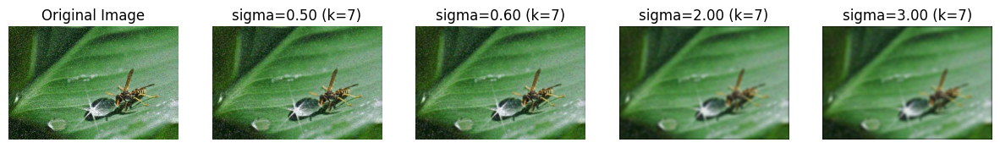

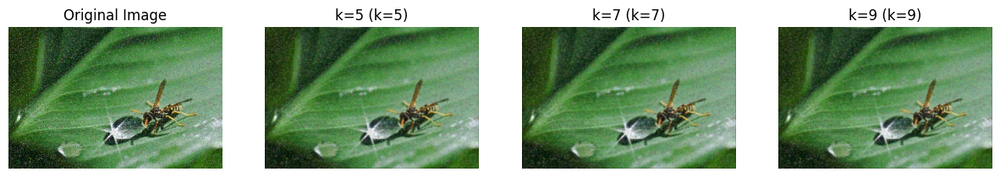

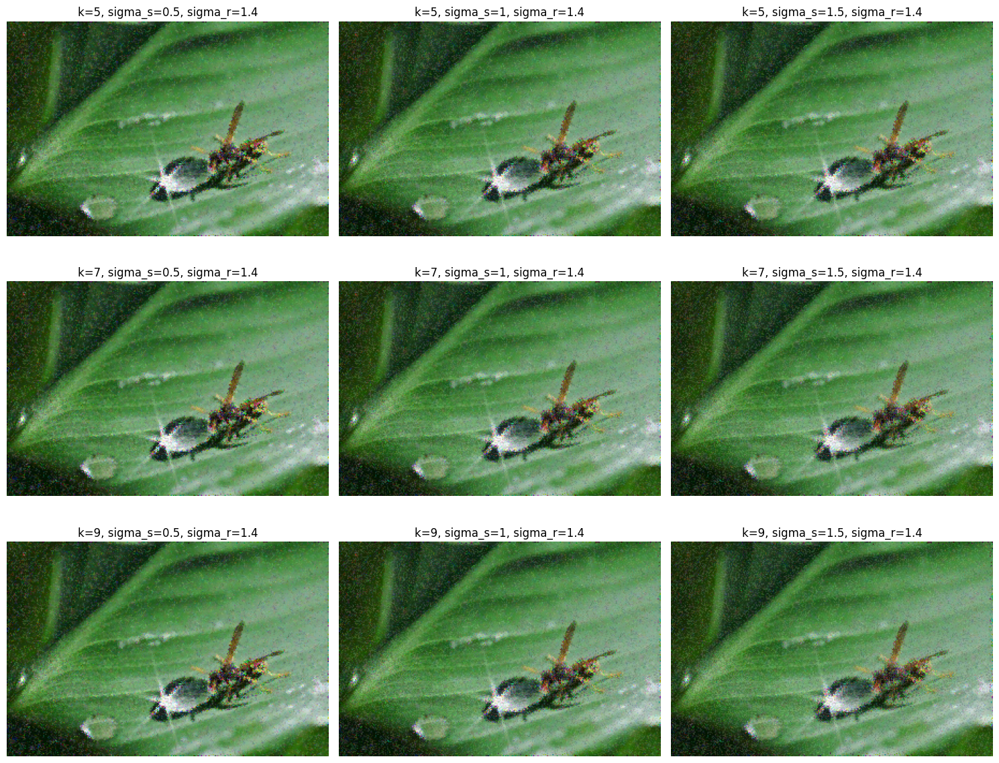

In [50]:
# --- 1. Load Image ---
IMG2 = cv2.imread('../images/IMG2.jpg')
IMG2 = cv2.cvtColor(IMG2, cv2.COLOR_BGR2RGB)

# --- 3. Gaussian Filter ---
def gaussFilter(img, k=7, sigma=1):
    # Generate Gaussian Kernel
    ax = np.linspace(-(k // 2), k // 2, k)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
    kernel = np.outer(gauss, gauss)
    kernel = kernel / np.sum(kernel)
    
    img1 = np.zeros_like(img)
    img1[:, :, 0] = conv2D(img[:, :, 0], kernel)
    img1[:, :, 1] = conv2D(img[:, :, 1], kernel)
    img1[:, :, 2] = conv2D(img[:, :, 2], kernel)
    # Apply the Gaussian kernel using conv2D
    return img1

# --- 4. Determine Optimal Sigma ---
def determine_optimal_sigma(k=7):
    ax = np.linspace(-(k // 2), k // 2, k)
    sigma_values = np.linspace(0.5, 3, 1000)  # Trying values from 0.5 to 3
    optimal_sigma = 0
    best_ratio = 0
    target_area = 0.99
    
    for sigma in sigma_values:
        gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
        kernel = np.outer(gauss, gauss)
        kernel_sum = np.sum(kernel)
        
        # Calculate how much of the distribution is within the kernel
        kernel_ratio = np.sum(kernel[kernel > 0.001]) / kernel_sum
        
        if np.abs(kernel_ratio - target_area) < np.abs(best_ratio - target_area):
            best_ratio = kernel_ratio
            optimal_sigma = sigma
    
    return optimal_sigma

# --- 5. Display Results with Different Sigmas ---
def display_gaussian_results(img, sigma_values, k=7):
    results = []
    
    for sigma in sigma_values:
        result = gaussFilter(img, k=k, sigma=sigma)
        results.append(result)
        
    plot_images(img, results, [f'sigma={sigma:.2f}' for sigma in sigma_values], [k]*len(sigma_values))

# --- 6. Plotting Function ---
def plot_images(original, filtered_results, filter_names, kernel_sizes):
    n_filters = len(filtered_results)
    fig, axs = plt.subplots(1, n_filters + 1, figsize=(15, 6))  # Reduced plot size
    
    axs[0].imshow(original)
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    for i in range(n_filters):
        axs[i + 1].imshow(filtered_results[i])
        axs[i + 1].set_title(f'{filter_names[i]} (k={kernel_sizes[i]})')
        axs[i + 1].axis('off')
    
    plt.show()

# --- 7. Bilateral Filter ---
def bilateralFilter(img, k=7, sigma_s=1, sigma_r=1):
    h, w, c = img.shape
    pad_h, pad_w = k // 2, k // 2
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='constant', constant_values=0)
    result = np.zeros_like(img)
    
    for i in range(h):
        for j in range(w):
            for ch in range(c):
                i_min, i_max = i, i + k
                j_min, j_max = j, j + k
                
                patch = padded_img[i_min:i_max, j_min:j_max, ch]
                center_value = padded_img[i + pad_h, j + pad_w, ch]
                
                # Gaussian spatial weight
                spatial_gauss = np.exp(-((np.arange(k) - pad_h) ** 2 + (np.arange(k)[:, None] - pad_w) ** 2) / (2 * sigma_s ** 2))
                
                # Gaussian range weight
                range_gauss = np.exp(-(patch - center_value) ** 2 / (2 * sigma_r ** 2))
                
                # Bilateral Filter kernel
                kernel = spatial_gauss * range_gauss
                kernel /= np.sum(kernel)
                
                result[i, j, ch] = np.sum(patch * kernel)
    
    return result
    
def plot_bilateral_vary_params(img, k_vals=[5, 7, 9], sigma_s_vals=[0.5,1,1.5], sigma_r_vals=[0.6,1,1.4]):
    fig, axs = plt.subplots(len(k_vals), len(sigma_s_vals), figsize=(15, 12))
    
    for i, k in enumerate(k_vals):
        for j, sigma_s in enumerate(sigma_s_vals):
            for sigma_r in sigma_r_vals:
                filtered_img = bilateralFilter(img, k, sigma_s, sigma_r)
                ax = axs[i, j]
                ax.imshow(filtered_img)
                ax.set_title(f'k={k}, sigma_s={sigma_s}, sigma_r={sigma_r}')
                ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# 1. Find the optimal sigma
optimal_sigma = determine_optimal_sigma(k=7)
print(f'Optimal sigma: {optimal_sigma}')

# 2. Display Gaussian Filter results for different sigmas
sigma_values = [0.5, optimal_sigma, 2, 3]
display_gaussian_results(IMG2, sigma_values, k=7)

# 3. Display results for varying kernel sizes with the optimal sigma
kernel_sizes = [5, 7, 9]
gaussian_results = [gaussFilter(IMG2, k=k, sigma=optimal_sigma) for k in kernel_sizes]
plot_images(IMG2, gaussian_results, [f'k={k}' for k in kernel_sizes], kernel_sizes)


# 4. Display Bilateral Filter results with varying sigma_s and sigma_r
sigma_s_vals = [0.5,1,1.5]
sigma_r_vals = [0.6,1,1.4]
plot_bilateral_vary_params(IMG2, k_vals=kernel_sizes, sigma_s_vals=sigma_s_vals, sigma_r_vals=sigma_r_vals)


### 3. Edge of Glory
- Sobel Filter: Useful for detecting edges with stronger intensity changes. It captures both vertical and horizontal edges and is sensitive to noise.
- Prewitt Filter: Similar to Sobel but slightly less sensitive to noise. Good for detecting edges in areas with lower gradients.
- Roberts Filter: Provides sharper edges but is sensitive to noise. It works better with small details but may miss softer edges.
- Laplacian Filter: Highlights regions of rapid intensity change in all directions. With increasing kernel size, edges become more emphasized, but the details might blur slightly.
- We observe that a larger kernel size broadens the blur, enhancing overall sharpness but risking loss of finer details, while a smaller kernel retains fine textures but may yield a less pronounced sharpening effect. Adjusting sigma determines the degree of Gaussian blur: a larger sigma enhances edge contrast and sharpness but may introduce artifacts, whereas a smaller σ preserves detail and achieves sharpness without significant distortion.
- Hence, for clean images and general edge detection, Sobel and Prewitt are good choices, with Sobel being slightly more noise-resistant.
For fine, diagonal edges, Roberts excels but may require noise handling.
For detecting detailed and complex edge structures in all directions, Laplacian is ideal, but it should be combined with smoothing techniques to reduce noise sensitivity.

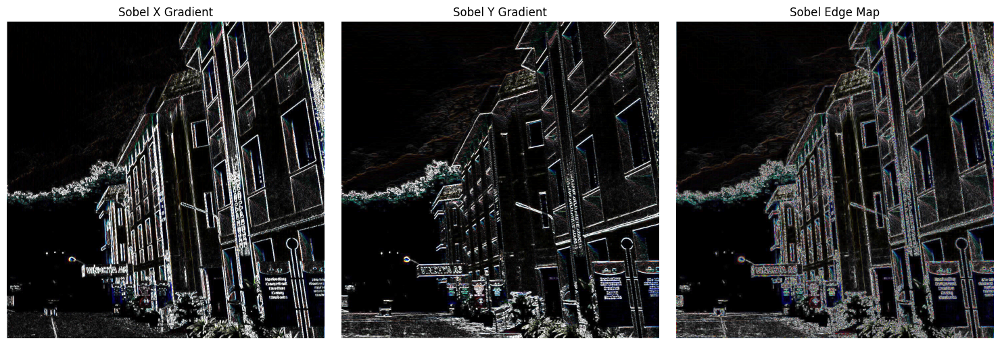

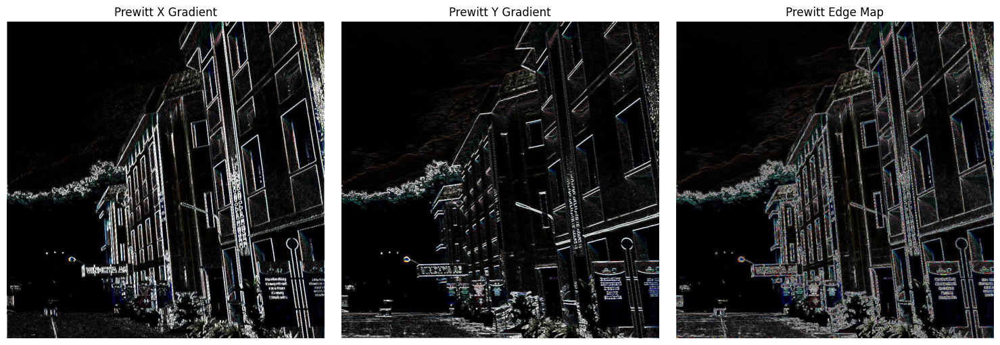

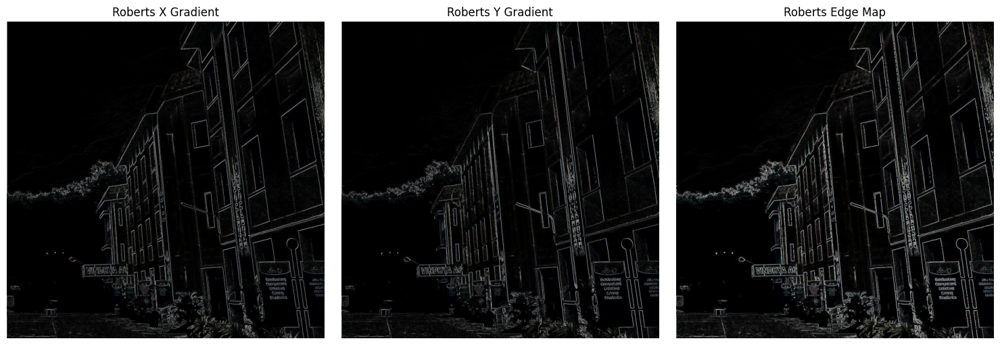

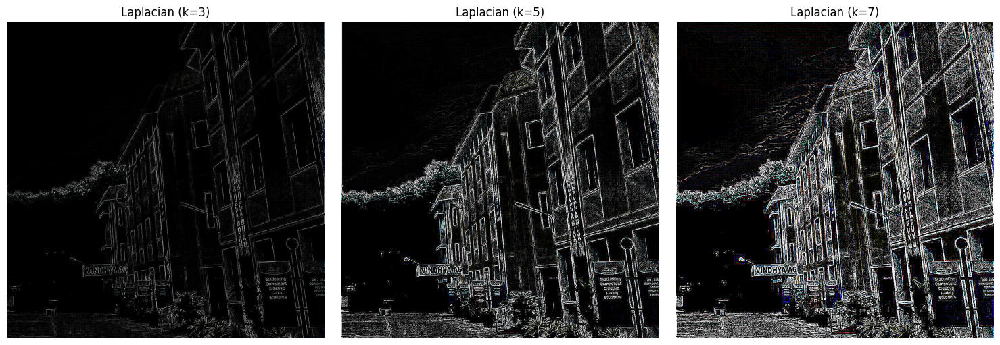

In [51]:
# --- Sobel Filter ---
def sobelFilter(img):
    # Sobel kernels
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    # Apply Sobel filter for horizontal and vertical edges
    grad_x=np.zeros_like(img,dtype=np.float64)
    grad_y=np.zeros_like(img,dtype=np.float64)
    for i in range(img.shape[2]):
        grad_x[:,:,i] = conv2D(img[:,:,i], sobel_x)
        grad_y[:,:,i] = conv2D(img[:,:,i], sobel_y)

    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    gradient_magnitude = np.uint8(gradient_magnitude)

    return grad_x, grad_y, gradient_magnitude

# --- Prewitt Filter ---
def prewittFilter(img):
    # Prewitt kernels
    prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

    # Apply Prewitt filter for horizontal and vertical edges
    grad_x=np.zeros_like(img,dtype=np.float64)
    grad_y=np.zeros_like(img,dtype=np.float64)
    for i in range(img.shape[2]):
        grad_x[:,:,i] = conv2D(img[:,:,i], prewitt_x)
        grad_y[:,:,i] = conv2D(img[:,:,i], prewitt_y)
        
    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    gradient_magnitude = np.uint8(gradient_magnitude)

    return grad_x, grad_y, gradient_magnitude

# --- Roberts Cross Filter ---
def robertsFilter(img):
    # Roberts kernels
    roberts_x = np.array([[1, 0], [0, -1]])
    roberts_y = np.array([[0, 1], [-1, 0]])

    # Apply Roberts cross operator for horizontal and vertical edges
    grad_x=np.zeros_like(img,dtype=np.float64)
    grad_y=np.zeros_like(img,dtype=np.float64)
    for i in range(img.shape[2]):
        grad_x[:,:,i] = conv2D(img[:,:,i], roberts_x)
        grad_y[:,:,i] = conv2D(img[:,:,i], roberts_y)

    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    gradient_magnitude = np.uint8(gradient_magnitude)

    return grad_x, grad_y, gradient_magnitude

def robertsFilter(img):
    kernel_x = np.array([[1, 0],
                         [0, -1]])
    kernel_y = np.array([[0, 1],
                         [-1, 0]])

    roberts_x_result = np.zeros_like(img, dtype=np.float64)
    roberts_y_result = np.zeros_like(img, dtype=np.float64)
    for i in range(img.shape[2]):
        roberts_x_result[:, :, i] = conv2D(img[:, :, i], kernel_x)
        roberts_y_result[:, :, i] = conv2D(img[:, :, i], kernel_y)
    magnitude = np.sqrt(roberts_x_result**2 +
                        roberts_y_result**2).astype(np.uint8)
    return roberts_x_result, roberts_y_result, magnitude

# --- Laplacian Filter ---
def laplacianFilter(img, k):
    if (k == 3):
        laplacian_kernel = np.array([[0, -1, 0],
                                     [-1, 4, -1],
                                     [0, -1, 0]])
    if (k == 5):
        laplacian_kernel = np.array([[0, 0, -1, 0, 0],
                                     [0, -1, -2, -1, 0],
                                     [-1, -2, 16, -2, -1],
                                     [0, -1, -2, -1, 0],
                                     [0, 0, -1, 0, 0]])
        
    if (k == 7):
        laplacian_kernel = np.array([[0, 0, 0, -1, 0, 0, 0],
                                     [0, 0, -1, -2, -1, 0, 0],
                                     [0, -1, -2, -4, -2, -1, 0],
                                     [-1, -2, -4, 44, -4, -2, -1],
                                     [0, -1, -2, -4, -2, -1, 0],
                                     [0, 0, -1, -2, -1, 0, 0],
                                     [0, 0, 0, -1, 0, 0, 0]])

    laplacian_result = np.zeros_like(img, dtype=np.float64)
    for i in range(img.shape[2]):
        laplacian_result[:, :, i] = conv2D(img[:, :, i], laplacian_kernel)
    laplacian_result = np.clip(laplacian_result, 0, 255).astype(np.uint8)
    return laplacian_result

# --- Plot Results ---
def plot_filters(img, filter_name, grad_x, grad_y, edge_map):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Plot X gradient
    axs[0].imshow(cv2.convertScaleAbs(grad_x))
    axs[0].set_title(f'{filter_name} X Gradient')
    axs[0].axis('off')

    # Plot Y gradient
    axs[1].imshow(cv2.convertScaleAbs(grad_y))
    axs[1].set_title(f'{filter_name} Y Gradient')
    axs[1].axis('off')

    # Plot Edge map
    axs[2].imshow(cv2.convertScaleAbs(edge_map))
    axs[2].set_title(f'{filter_name} Edge Map')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- Plot Laplacian Results in 1x3 Subplots ---
def plot_laplacian_filters(img, kernel_sizes):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5)) 

    for i, k in enumerate(kernel_sizes):
        laplacian = laplacianFilter(img, k)

        axs[i].imshow(cv2.convertScaleAbs(laplacian))
        axs[i].set_title(f'Laplacian (k={k})')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

# --- Load Image ---
IMG3 = cv2.imread('../images/IMG3.jpeg')
IMG3 = cv2.cvtColor(IMG3,cv2.COLOR_BGR2RGB)

# --- Apply Sobel Filter ---
sobel_x, sobel_y, sobel_edge = sobelFilter(IMG3)
plot_filters(IMG3, 'Sobel', sobel_x, sobel_y, sobel_edge)

# --- Apply Prewitt Filter ---
prewitt_x, prewitt_y, prewitt_edge = prewittFilter(IMG3)
plot_filters(IMG3, 'Prewitt', prewitt_x, prewitt_y, prewitt_edge)

# --- Apply Roberts Filter ---
roberts_x, roberts_y, roberts_edge = robertsFilter(IMG3)
plot_filters(IMG3, 'Roberts', roberts_x, roberts_y, roberts_edge)

# --- Apply and Plot Laplacian Filter for k=3, k=5, k=7 ---
kernel_sizes = [3, 5, 7]
plot_laplacian_filters(IMG3, kernel_sizes)


### Sharpen Up

- Applying the Laplacian filter with varying kernel sizes we observe distinct effects on edge detection and noise management. Smaller kernel sizes enhance the detection of finer details and sharper edges, making them more sensitive to noise, which can introduce artifacts in the output. 
- In contrast, larger kernel sizes provide a smoother result by reducing noise and emphasizing more prominent edges, but at the cost of blurring finer details and small features.
- Thus, smaller kernels are ideal for precise edge detection, while larger kernels are better suited for overall noise reduction and enhancing dominant edges in the image.
- As the A value increases, the image is sharpened more in comparison to the original image. 
- We see that the boundaries of the lunar surface are getiing more sharpened, highlighting the fact that it is a region of stark contrast of gradients in the image.
- A value also has a contribution towards brightening up of whiter regions and darkening up of darker regions, which leads to increased response of sharpness in the image.
- Highboost filtering provides more control over the sharpening process, as the boost factor can be tuned
- Highboost filtering allows for greater amplification of high-frequency details, making it more effective for images where subtle textures, intricate patterns, or fine edges need to be sharpened.
- Highboost filtering offers more precision and better performance for enhancing intricate textures and details without significantly increasing noise.


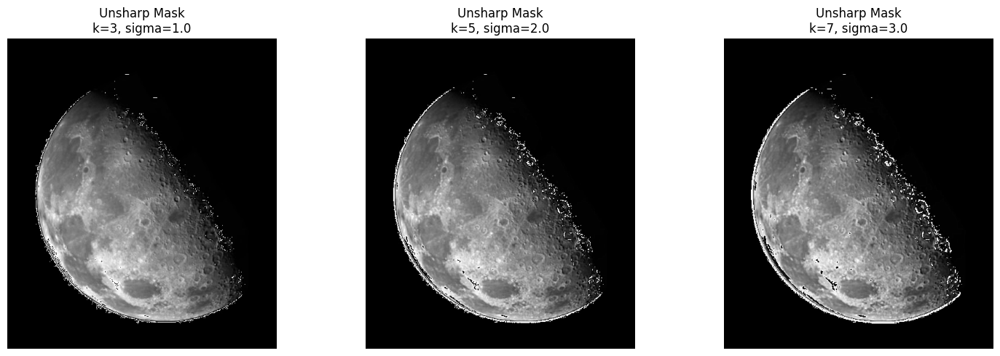

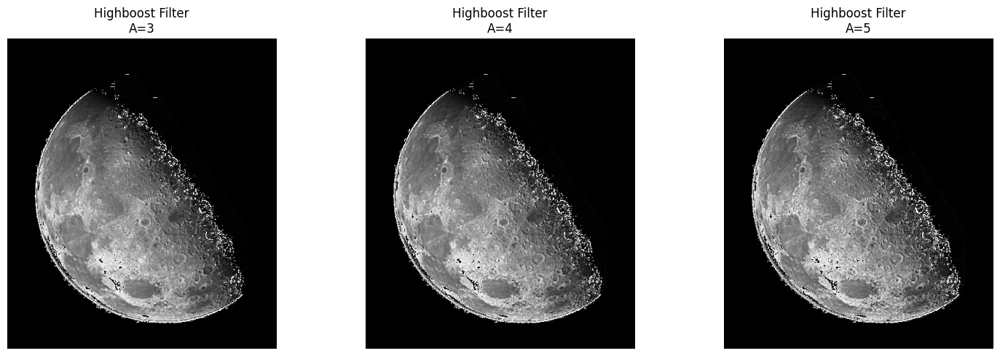

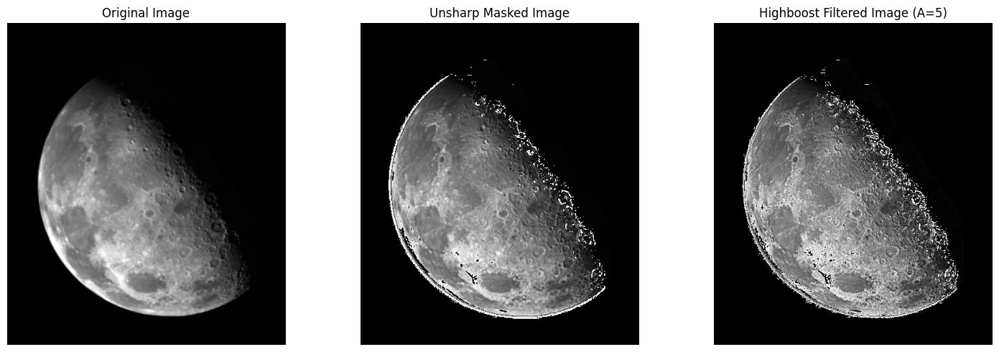

In [52]:
def generateGaussianKernel(size, sigma):
    kernel = np.fromfunction(lambda x, y: (1/(np.sqrt(2*np.pi*sigma**2)))*np.exp(-((x-(size-1)/2)**2+(y-(size-1)/2)**2)/(2*sigma**2)), (size, size))
    kernel=kernel/np.sum(kernel)
    return kernel

def gaussianBlur(img, size=7, sigma=1):
    img1 = np.zeros_like(img,dtype=np.float64)
    kernel = generateGaussianKernel(size, sigma)
    img1[:, :, 0] = conv2D(img[:, :, 0], kernel)
    img1[:, :, 1] = conv2D(img[:, :, 1], kernel)
    img1[:, :, 2] = conv2D(img[:, :, 2], kernel)
    return np.clip(img1,0,255).astype(np.uint8)

# --- Unsharp Masking function ---
def unsharpMask(img, k, sigma):
    blurred_img = gaussianBlur(img, k, sigma)
    mask = img - blurred_img  # Subtract blurred from original
    sharpened_img = img + mask  # Add mask to original
    return sharpened_img

# --- Highboost Filtering function ---
def highboostFilter(img, k, sigma, A):
    blurred_img = gaussianBlur(img, k, sigma)
    mask = img - blurred_img  # Subtract blurred from original
    highboost_img = img + A*mask  # Add mask to original
    highboost_img = np.clip(highboost_img, 0, 255)
    return highboost_img

# --- Load Image (Assuming a grayscale image) ---
IMG4 = cv2.imread('../images/IMG4.png')
IMG4 = cv2.cvtColor(IMG4, cv2.COLOR_BGR2RGB)

# --- Plotting Unsharp Mask results for multiple k and sigma ---
def plotUnsharpMask(img, kernel_sizes, sigmas):
    fig, axs = plt.subplots(1, len(kernel_sizes), figsize=(15, 5))

    for i, (k, sigma) in enumerate(zip(kernel_sizes, sigmas)):
        sharpened_img = unsharpMask(img, k, sigma)
        
        axs[i].imshow(sharpened_img, cmap='gray')
        axs[i].set_title(f'Unsharp Mask\nk={k}, sigma={sigma}')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()
    
    return sharpened_img

# --- Plotting Highboost results for multiple A ---
def plotHighboostFilter(img, kernel_size, sigma, A_values):
    fig, axs = plt.subplots(1, len(A_values), figsize=(15, 5))

    for i, A in enumerate(A_values):
        highboost_img = highboostFilter(img, kernel_size, sigma, A)
         
        axs[i].imshow(highboost_img, cmap='gray')
        axs[i].set_title(f'Highboost Filter\nA={A}')
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return highboost_img

# --- Apply and Plot Unsharp Mask for different kernel sizes and sigmas ---
kernel_sizes = [3, 5, 7]
sigmas = [1.0, 2.0, 3.0]
unsharp_img=plotUnsharpMask(IMG4, kernel_sizes, sigmas)

# --- Apply and Plot Highboost Filter for different A values ---
A_values = [3, 4, 5]
highboost_img=plotHighboostFilter(IMG4, kernel_size=5, sigma=1.0, A_values=A_values)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(IMG4, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Unsharp masked image
axs[1].imshow(unsharp_img, cmap='gray')
axs[1].set_title('Unsharp Masked Image')
axs[1].axis('off')

# Highboost filtered image
axs[2].imshow(highboost_img, cmap='gray')
axs[2].set_title(f'Highboost Filtered Image (A={A_values[-1]})')
axs[2].axis('off')

plt.tight_layout()
plt.show()



### 5.1 Rain Rain Go Away!

- Mean and Median filters: As k increases, image is blurred but the rain is also cleared from the image for both mean and median filter. 

- Gauss Filter: In this case too the above reasoning follows with value of k and for sigma values, as sigma increases, rain disappears but image is blurred. The closest we can get to the target image is the image corresponding to k=7 and sigma=3.

- Bilateral Filter: In this case too the above reasoning follows with value of k and for sigma values. The closest we can get to the target image is the image corresponding to k=7, spatial sigma=75 and range sigma=75.

-  Median filter and Gaussian Filter with the specific hyperparameters seem to be the best because, Bilateral Filtering with these values is leading to smoothening of image simultaneously, which can again adds rain back to the image

Evaluating Mean Filter...
Mean Filter (k=3): GMD=72.6280, PD=102.1965
Mean Filter (k=5): GMD=81.8110, PD=111.1458
Mean Filter (k=7): GMD=81.4241, PD=114.7513
Evaluating Median Filter...
Median Filter (k=3): GMD=59.7861, PD=80.8370
Median Filter (k=5): GMD=64.3635, PD=105.4165
Median Filter (k=7): GMD=65.7748, PD=112.5894
Evaluating Gaussian Filter...
Gaussian Filter (k=3, sigma=1.0): GMD=68.1917, PD=97.2242
Gaussian Filter (k=5, sigma=2.0): GMD=78.4351, PD=109.1267
Gaussian Filter (k=7, sigma=3.0): GMD=79.5511, PD=113.4073
Evaluating Bilateral Filter...
Bilateral Filter (k=5, sigma_s=50, sigma_r=50): GMD=81.5686, PD=110.8320
Bilateral Filter (k=7, sigma_s=75, sigma_r=75): GMD=81.3610, PD=114.7059
Bilateral Filter (k=9, sigma_s=100, sigma_r=100): GMD=81.2377, PD=117.5512


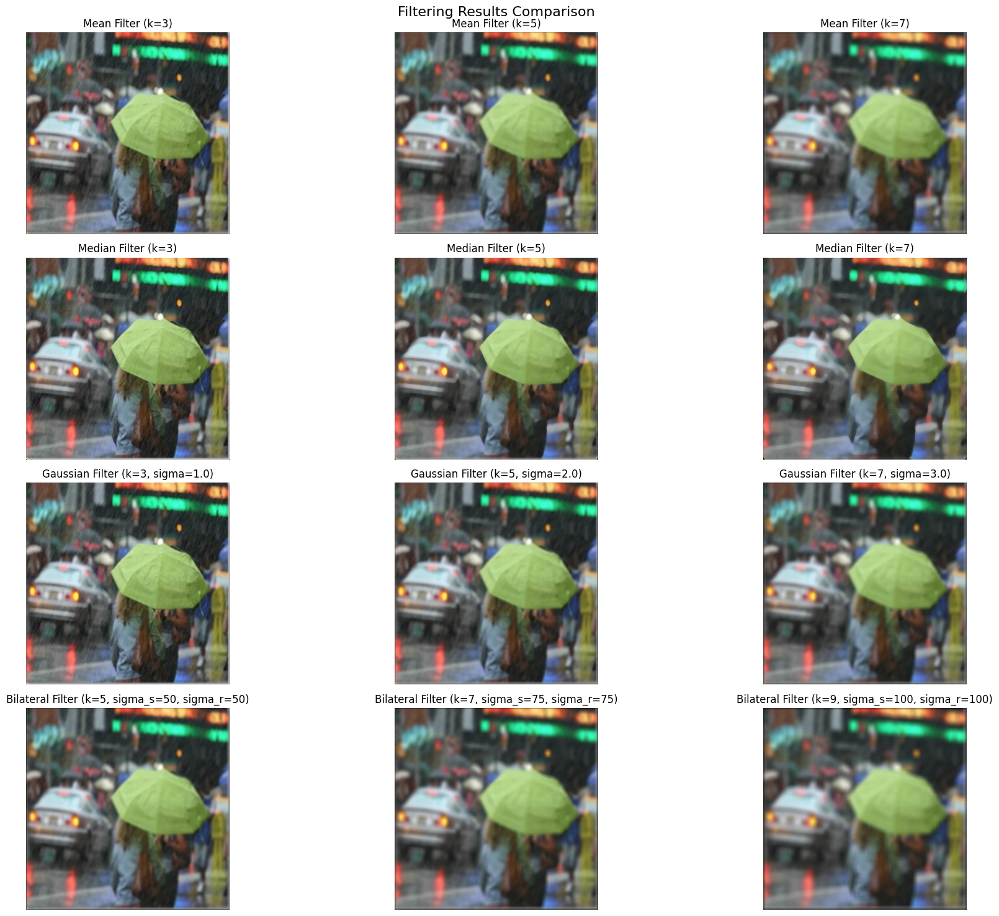

In [53]:
# --- Evaluation Metric: Gradient Magnitude Difference (GMD) and Pixel Difference (PD) ---
def gradient_magnitude(img):
    _,_,gradient_mag=sobelFilter(img)
    return gradient_mag

def evaluate_performance(original_img, filtered_img):
    grad_original = gradient_magnitude(original_img)
    grad_filtered = gradient_magnitude(filtered_img)

    # Gradient Magnitude Difference (GMD)
    gmd = np.mean(np.abs(grad_original - grad_filtered))

    # Pixel Difference (PD) for noise reduction
    pd = np.mean(np.abs(original_img - filtered_img))

    # Higher GMD implies worse edge preservation, and higher PD implies worse noise removal
    return gmd, pd

# --- Function to Apply and Evaluate Multiple Filters ---
def evaluate_filters(img, mean_k_values, median_k_values, gaussian_params, bilateral_params):
    fig, axs = plt.subplots(4, max(len(mean_k_values), len(median_k_values), len(gaussian_params), len(bilateral_params)), figsize=(20, 15))
    fig.suptitle('Filtering Results Comparison', fontsize=16)

    original_img = img.copy()
    
    # --- Mean Filter ---
    print("Evaluating Mean Filter...")
    for idx, k in enumerate(mean_k_values):
        mean_img = meanFilter(img, k=k)
        axs[0, idx].imshow(mean_img)
        axs[0, idx].set_title(f'Mean Filter (k={k})')
        axs[0, idx].axis('off')

        gmd, pd = evaluate_performance(original_img, mean_img)
        print(f'Mean Filter (k={k}): GMD={gmd:.4f}, PD={pd:.4f}')

    # --- Median Filter ---
    print("Evaluating Median Filter...")
    for idx, k in enumerate(median_k_values):
        median_img = medianFilter(img, k=k)
        axs[1, idx].imshow(median_img)
        axs[1, idx].set_title(f'Median Filter (k={k})')
        axs[1, idx].axis('off')

        gmd, pd = evaluate_performance(original_img, median_img)
        print(f'Median Filter (k={k}): GMD={gmd:.4f}, PD={pd:.4f}')

    # --- Gaussian Filter ---
    print("Evaluating Gaussian Filter...")
    for idx, (k, sigma) in enumerate(gaussian_params):
        gaussian_img = gaussianBlur(img, size=k, sigma=sigma)
        axs[2, idx].imshow(gaussian_img)
        axs[2, idx].set_title(f'Gaussian Filter (k={k}, sigma={sigma})')
        axs[2, idx].axis('off')

        gmd, pd = evaluate_performance(original_img, gaussian_img)
        print(f'Gaussian Filter (k={k}, sigma={sigma}): GMD={gmd:.4f}, PD={pd:.4f}')

    # --- Bilateral Filter ---
    print("Evaluating Bilateral Filter...")
    for idx, (k, sigma_s, sigma_r) in enumerate(bilateral_params):
        bilateral_img = bilateralFilter(img, k=k, sigma_s=sigma_s, sigma_r=sigma_r)
        axs[3, idx].imshow(bilateral_img)
        axs[3, idx].set_title(f'Bilateral Filter (k={k}, sigma_s={sigma_s}, sigma_r={sigma_r})')
        axs[3, idx].axis('off')

        gmd, pd = evaluate_performance(original_img, bilateral_img)
        print(f'Bilateral Filter (k={k}, sigma_s={sigma_s}, sigma_r={sigma_r}): GMD={gmd:.4f}, PD={pd:.4f}')

    plt.tight_layout()
    plt.show()


IMG4 = cv2.imread('../images/IMG5.jpg')
IMG4 = cv2.cvtColor(IMG4, cv2.COLOR_BGR2RGB)

mean_k_values = [3, 5, 7]
median_k_values = [3, 5, 7]
gaussian_params = [(3, 1.0), (5, 2.0), (7, 3.0)]
bilateral_params = [(5, 50, 50), (7, 75, 75), (9, 100, 100)]

# --- Evaluate all filters and report the best parameters ---
evaluate_filters(IMG4, mean_k_values, median_k_values, gaussian_params, bilateral_params)

### 5.2 
- The image contains salt and pepper noise

- Median filtering should give the best result for removing salt and pepper noise while keeping edges intact.

- Mean filtering reduces noise but blur the image.

- Gaussian filtering provides decent noise reduction, but not as effective for salt and pepper noise.

- Bilateral filtering smooths out noise and preserve edges to a good extent but not perform as well as median filtering for this type of noise.

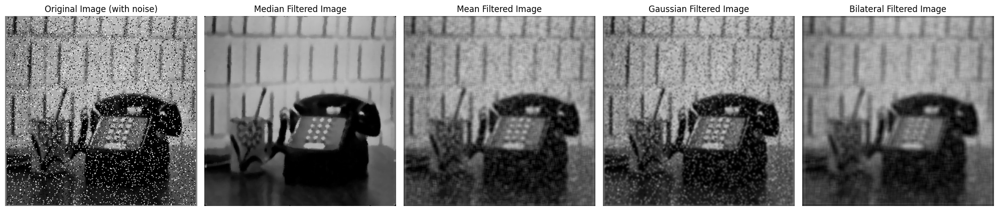

In [54]:
IMG6 = cv2.imread('../images/IMG6.png')
IMG6 = cv2.cvtColor(IMG6, cv2.COLOR_BGR2RGB)

# --- Apply Median Filter (Best for Salt and Pepper Noise) ---
median_filtered_img = medianFilter(IMG6, k=5)

# --- Apply Mean Filter ---
mean_filtered_img = meanFilter(IMG6, k=5)

# --- Apply Gaussian Filter ---
gaussian_filtered_img = gaussianBlur(IMG6, size=5, sigma=1.0)

# --- Apply Bilateral Filter ---
bilateral_filtered_img = bilateralFilter(IMG6, k=7, sigma_s=50, sigma_r=50)

# --- Display the results ---
fig, axs = plt.subplots(1, 5, figsize=(20, 10))

# Original Image
axs[0].imshow(IMG6)
axs[0].set_title('Original Image (with noise)')
axs[0].axis('off')

# Median Filtered
axs[1].imshow(median_filtered_img)
axs[1].set_title('Median Filtered Image')
axs[1].axis('off')

# Mean Filtered
axs[2].imshow(mean_filtered_img)
axs[2].set_title('Mean Filtered Image')
axs[2].axis('off')

# Gaussian Filtered
axs[3].imshow(gaussian_filtered_img)
axs[3].set_title('Gaussian Filtered Image')
axs[3].axis('off')

# Bilateral Filtered
axs[4].imshow(bilateral_filtered_img)
axs[4].set_title('Bilateral Filtered Image')
axs[4].axis('off')

plt.tight_layout()
plt.show()


### Transform and Conquer

#### 6a.1 Counting Coins

Steps taken in the above are as follows: 

1. Binarization:
Pixels with intensity values less than or equal to 127 are set to 0 (black), and the rest are set to 255 (white).

2. Erosion:
Erosion shrinks objects in the image, effectively separating touching objects. The size of the structuring element determines the amount of erosion applied.

3. Dilation:
Dilation expands objects in the image, helping to restore the original size of the separated objects. The size of the structuring element determines the amount of dilation applied.

4. Conversion to 255:
This ensures that the final image is displayed in a visually understandable format.

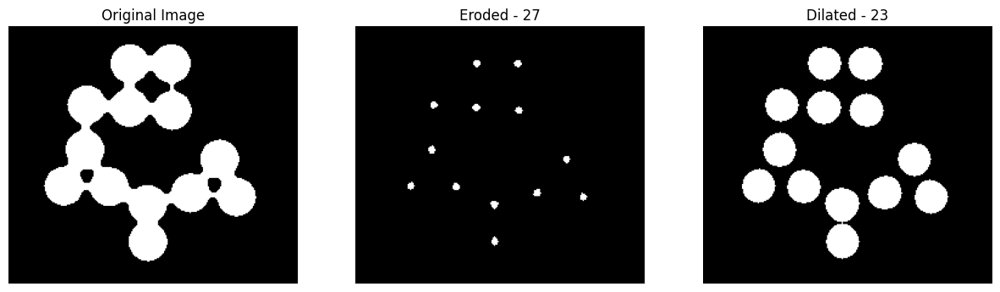

In [55]:
def convert_to_binary(image_src, thresh_val=127):
    color_1 = 255
    color_2 = 0
    initial_conv = np.where((image_src <= thresh_val), image_src, color_1)
    final_conv = np.where((initial_conv > thresh_val), initial_conv, color_2)
    return final_conv

def create_circular_kernel(size):
    center = size // 2
    Y, X = np.ogrid[:size, :size]
    dist_from_center = np.sqrt((X - center) ** 2 + (Y - center) ** 2)
    circular_kernel = (dist_from_center <= center).astype(np.uint8) * 255
    return circular_kernel


def perform_erosion(image_src, erosion_level=3):
    structuring_kernel = create_circular_kernel(erosion_level)
    kernel_size = structuring_kernel.shape[0]

    pad_width = kernel_size // 2
    image_pad = np.pad(image_src, pad_width=pad_width, mode='constant', constant_values=0)
    eroded_image = np.zeros_like(image_src)

    # Apply erosion: All pixels under the kernel must match to erode
    for i in range(image_src.shape[0]):
        for j in range(image_src.shape[1]):
            region = image_pad[i:i + kernel_size, j:j + kernel_size]
            if np.all(region[structuring_kernel == 255] == 255):
                eroded_image[i, j] = 255
            else:
                eroded_image[i, j] = 0

    return eroded_image

def perform_dilation(image_src, dilation_level=3):
    structuring_kernel = create_circular_kernel(dilation_level)
    kernel_size = structuring_kernel.shape[0]

    pad_width = kernel_size // 2
    image_pad = np.pad(image_src, pad_width=pad_width, mode='constant', constant_values=0)
    dilated_image = np.zeros_like(image_src)

    # Apply dilation: If any pixel under the kernel is 255, the pixel will be 255
    for i in range(image_src.shape[0]):
        for j in range(image_src.shape[1]):
            region = image_pad[i:i + kernel_size, j:j + kernel_size]
            if np.any(region[structuring_kernel == 255] == 255):
                dilated_image[i, j] = 255
            else:
                dilated_image[i, j] = 0

    return dilated_image

def process_and_plot_image(image_file, erosion_level=19, dilation_level=19, thresh_val=127):
    image_src = cv2.imread(image_file, 0)
    image_bin = convert_to_binary(image_src, thresh_val=thresh_val)
    eroded_img = perform_erosion(image_bin, erosion_level=erosion_level)
    dilated_img = perform_dilation(eroded_img, dilation_level=dilation_level)
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
    
    ax1.axis("off")
    ax1.title.set_text('Original Image')

    ax2.axis("off")
    ax2.title.set_text(f'Eroded - {erosion_level}')

    ax3.axis("off")
    ax3.title.set_text(f'Dilated - {dilation_level}')

    ax1.imshow(image_bin, cmap='gray')
    ax2.imshow(eroded_img, cmap='gray')
    ax3.imshow(dilated_img, cmap='gray')

    plt.show()

process_and_plot_image('../images/IMG7.jpg', erosion_level=27, dilation_level=23, thresh_val=127)


#### 6a.2 Signature Verfication

- The fraudulent signatures generally have more complex skeletons, suggesting deliberate attempts to disguise the writer's identity.

- The fraudulent signatures tend to have more pronounced loops and curves, which can be a sign of forgery.

- While the overall structures are similar, the specific shapes and proportions of individual elements differ significantly between the original and fraudulent signatures.

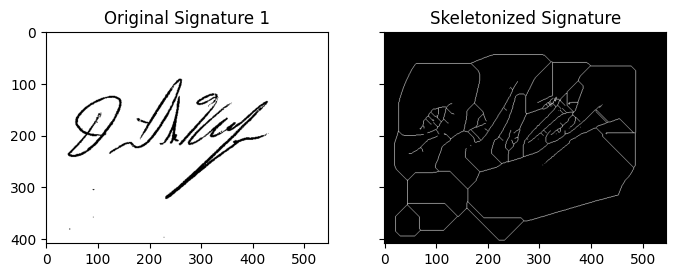

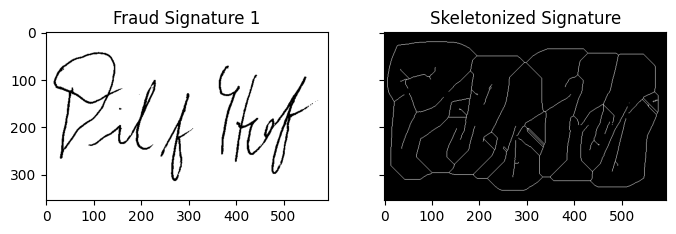

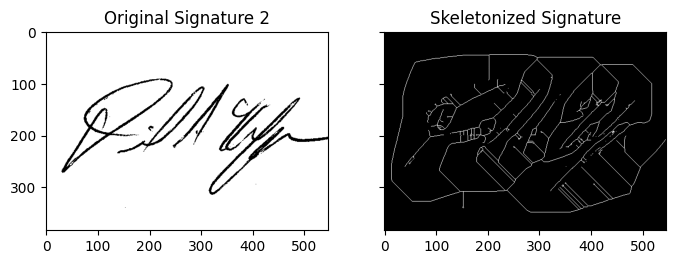

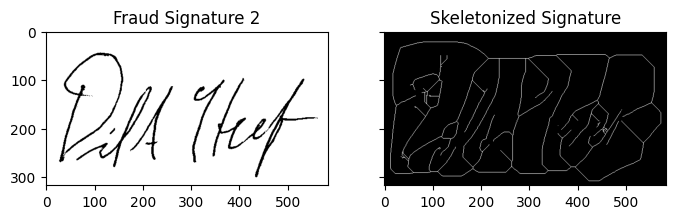

In [56]:
from skimage import io, color
from skimage.morphology import skeletonize
from skimage.util import invert

orig_sig1=cv2.imread('../images/original_10_12.png',cv2.IMREAD_GRAYSCALE)
fraud_sig1=cv2.imread('../images/forgeries_10_12.png',cv2.IMREAD_GRAYSCALE)
orig_sig2=cv2.imread('../images/original_10_13.png',cv2.IMREAD_GRAYSCALE)
fraud_sig2=cv2.imread('../images/forgeries_10_13.png',cv2.IMREAD_GRAYSCALE)

images = [orig_sig1, fraud_sig1, orig_sig2, fraud_sig2]
img_names = ["Original Signature 1", "Fraud Signature 1", "Original Signature 2", "Fraud Signature 2"]
for i, image in enumerate(images):
    binary_signature = image < 200
    binary_signature = invert(binary_signature)
    skeleton = skeletonize(binary_signature)
    
    fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
    ax = axes.ravel()
    ax[0].imshow(binary_signature, cmap=plt.cm.gray)
    ax[0].set_title(f'{img_names[i]}')
    ax[1].imshow(skeleton, cmap='gray')
    ax[1].set_title('Skeletonized Signature')
    plt.show()

### 7. Body Scan Enhancement

Steps involved in the Pipeline are as follows:
1. Apply Gaussian Blur to reduce noise
2. Sharpen the image using Unsharp Masking (or Highboost Filter)
3. Use Sobel to detect skeletal edges (or Laplacian Filter)
4. Increased brightness in the skeletal regions based on the edge-detected image
5. Apply contrast adjustment to make the image more vivid

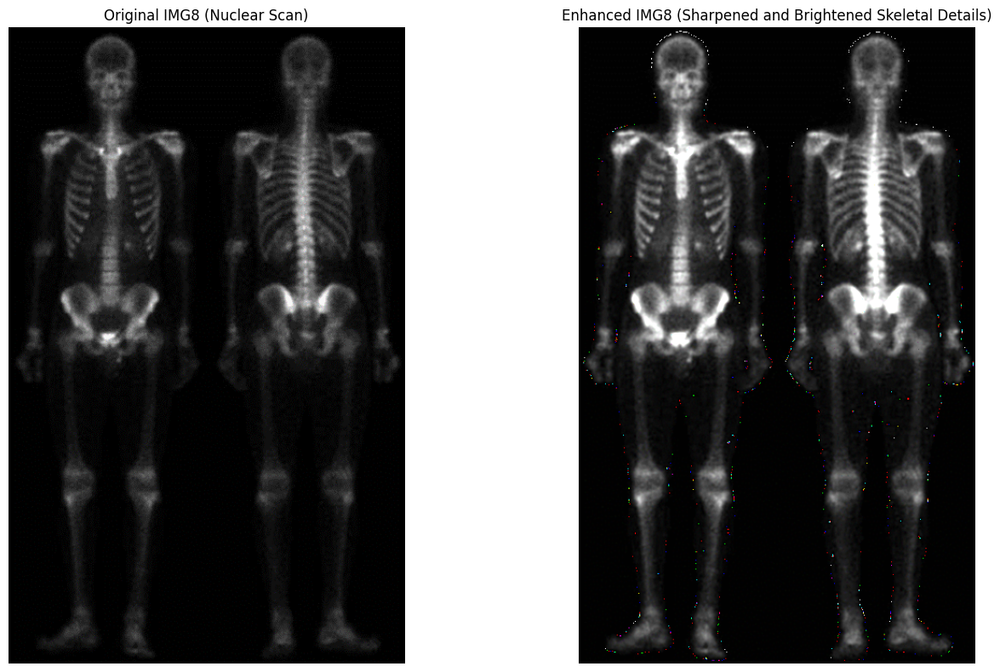

In [57]:
def increase_brightness_skeletal(img, edges, factor=1.5):
    img_bright = img.copy()
    img_bright = np.where(edges > 0, np.clip(img * factor, 0, 255), img) 
    return img_bright

def custom_adjust_contrast(img, alpha=1.2, beta=1):
    img = img.astype(np.float32)
    img_contrast = img * alpha + beta
    img_contrast = np.clip(img_contrast, 0, 255)
    return img_contrast.astype(np.uint8)


def adjust_contrast(img, alpha=1.2, beta=1):
    # alpha is the contrast factor, beta is the brightness addition
    img_contrast = custom_adjust_contrast(img, alpha=alpha, beta=beta)
    return img_contrast

def enhance_img8(img):
    blurred_img = gaussFilter(img, k=5, sigma=1)
    sharpened_img = unsharpMask(blurred_img, k=5, sigma=1)  
    grad_x, grad_y, sobel_edges = sobelFilter(sharpened_img)  
    bright_skeletal_img = increase_brightness_skeletal(sharpened_img, sobel_edges, factor=1.5)
    contrast_img = adjust_contrast(bright_skeletal_img, alpha=1.2)

    return contrast_img

# --- Load the image ---
IMG8 = cv2.imread('../images/IMG8.png')
IMG8 = cv2.cvtColor(IMG8, cv2.COLOR_BGR2RGB)

# --- Enhance the image ---
enhanced_IMG8 = enhance_img8(IMG8)

# --- Display the original and enhanced image ---
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[0].imshow(IMG8)
axs[0].set_title('Original IMG8 (Nuclear Scan)')
axs[0].axis('off')

axs[1].imshow(enhanced_IMG8,cmap='gray')
axs[1].set_title('Enhanced IMG8 (Sharpened and Brightened Skeletal Details)')
axs[1].axis('off')

plt.tight_layout()
plt.show()


###  8. You Can’t See Me

1. Median filtering: Median filtering replaces each pixel with the median value of its neighboring pixels which reduces salt-and-pepper noise while preserving edges.

2. Bilateral filtering:  The bilateral filter preserves edges while reducing noise by considering both spatial proximity and intensity similarity which results in preserving edges and reduces noise, especially for images with texture.

3. Highboost filtering: Highboost filtering enhances edges and details by amplifying high-frequency components, making the image sharper.

4. Histogram equalization: Improves contrast and enhances details.

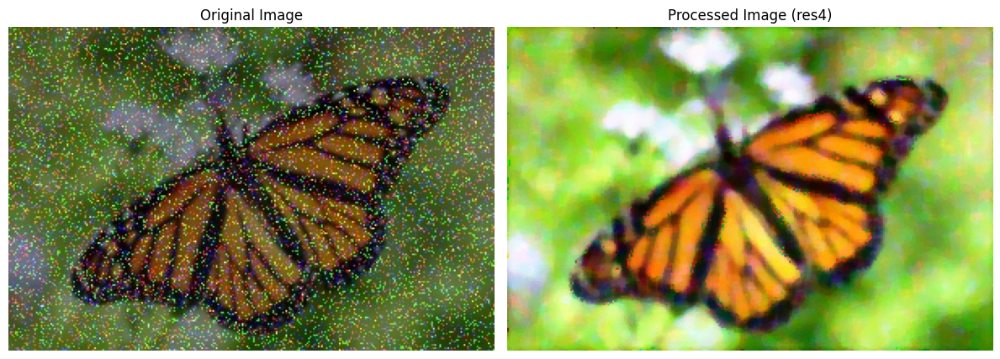

In [58]:
img = cv2.imread('../images/IMG9.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply median filter
res = medianFilter(img, 7)
res = np.clip(res, 0, 255).astype(np.uint8) 

# Apply bilateral filter
res2 = bilateralFilter(res, 9, 0.75, 0.75)
res2 = np.clip(res2, 0, 255).astype(np.uint8)  

# Apply highboost filter
res3 = highboostFilter(res2, 5, 0.25, 1.5)
res3 = np.clip(res3, 0, 255).astype(np.uint8) 

# Apply histogram equalization
def histequalize(image):
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * 255 / cdf[-1]
    image_equalized = np.interp(image.flatten(), bins[:-1], cdf_normalized)
    image_equalized = image_equalized.reshape(image.shape)
    return image_equalized.astype(np.uint8)

res4 = histequalize(res3)

fig, ax = plt.subplots(1, 2, figsize=(12, 6)) 


ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].axis('off') 

# Plot res4
ax[1].imshow(res4)
ax[1].set_title('Processed Image (res4)')
ax[1].axis('off')  

plt.tight_layout()
plt.show()
